<a href="https://colab.research.google.com/github/tanishqa14/Dog-Breed-Prediction/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

Data is from kaggle

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so it is probably best we use deep learning/transfer learing.
* There are 120 breeds of dogs ( this means there are 120 different classes).
* There are around 10000+ images in training set ( with labels).
* There are 10000+ images in test set ( without labels, we will predict them).


In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU


In [ ]:
# # if tensorflow version is not compatible
# # import tf 2.x
# try:
#   %tensorflow_version 2.x
# except Exception:
#   pass

In [ ]:
# Import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub 
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available ( yes )' if tf.config.list_physical_devices('GPU') else 'not available')

TF version: 2.8.2
TF Hub version: 0.12.0
GPU available ( yes )


## Getting our data ready ( turning into Tensors)

With all machine learning models, our data has to be in numerical format. So now we will turn our images into tensors (numerical repersentation)

Let's start by accessing labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/My Drive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head(2)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo


In [ ]:
# How many images of each breed?
# labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv.breed.value_counts().median()

82.0

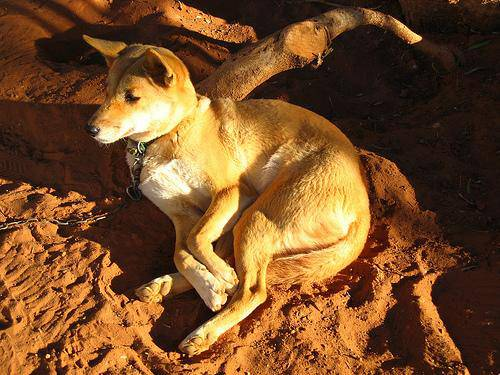

In [ ]:
# Let'view am image
from IPython.display import Image
Image('drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting Images and labels

let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head(2)

In [ ]:
# Create pathnames from image ID
filenames = ['drive/My Drive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv.id]

# check 
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/My Drive/Dog Vision/train/')) == len(filenames):
  print("yes")
else:
  print('no')

yes


In [ ]:
# one more check
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

Now let's prepare labels

In [ ]:
import numpy as np
labels = labels_csv.breed
labels = np.array(labels)

# or 
# labels = labels_csv.breed.to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

In [ ]:
# See if number of labesl matches the number of filenames
if len(labels) == len(filenames):
  print('yes')
else:
  print('no')

In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# turn a single label into array of booleans
print(labels[0])
labels[0] == unique_breeds

# returns an array of booleans which shows comparison of label[0] with every label in unique_breeds


In [ ]:
# turn every label into a boolena array
boolean_labels = [labels == unique_breeds for labels in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [ ]:
len(boolean_labels)

In [ ]:
# example  : turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolwan array
print(boolean_labels[0].astype(int)) # there will be 1 where the sample label occurs

In [ ]:
print(labels[90])
print(boolean_labels[90].astype(int))

In [ ]:
boolean_labels[:1]

In [ ]:
filenames[:2]

### creating our own validation set

since the dataset from kaggle does not have it

In [ ]:
# setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We are going to start of experimenting with ~1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, steo:1000}

# this is a feature in colab to make a slider, hecne we can increase our num of images.


In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split 
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES],
                                                      y[:NUM_IMAGES],
                                                      test_size=0.2,
                                                      random_state=42)
len(X_train), len(y_train), len(X_valid), len(y_valid)


(800, 800, 200, 200)

In [ ]:
# let's have a look at training set
X_train[:2], y_train[:2]

## Preprocessing Images ( turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be shape of (224,224)
6. Return the modified `image`

lets look what image looks like

In [ ]:
# convert image to numpy 
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
Image(filenames[42])

In [ ]:
image.max(), image.min()

In [ ]:
image[256]

In [ ]:
# turn image into tensor
tf.constant(image)[:2]

In [ ]:
img = imread(filenames[7])
img.shape

In [ ]:
tf.constant(img).shape

Now we know what image looks like as tensor,
lets make a function to preprocess them

In [ ]:
# define image size
IMG_SIZE = 224

# create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Take an image file path and turns the image into Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 color channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn data into batches?

Trying to process 10000+ images might not fit in memory.
So that's why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size)

To use tensorflow effectively, we need our data in the form of tensors tuples which look like this: `(image, label)`.

In [ ]:
# create a function to return tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label, processes the image 
  and return a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of above
(process_image(X[42]), tf.constant(y[42]))

Now we have got a way to turn our data into tuples of Tensors in the form: (image, label), lets make a function to turn all of our data (x and y) into batches

In [ ]:
# define the batch size, 32 is a good start
BATCH_SIZE = 32

# create a fucntion to turn dara into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches of data our of image (X) and label (y) pairs.
  Shuffles the data if it is training data but does not shuffle if it's validation data.
  Also accept test data as input (no labels).
  '''

  # if the data is test dataset, we dont have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, no need to shuffle
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # create (image, label) tuples (this also turns the iamge)
    data = data.map(get_image_label)

    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  
  return data_batch




In [ ]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_valid, y_valid, valid_data=True)

In [ ]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

 ## Visualizing Data Batches

 

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Display a plot of 25 images and their labels from a data breach.
  '''
  # setup a figure
  plt.figure(figsize=(10,10))
  # loop through 25 ( for displaying 25 images)
  for i in range(25):
    # create subplots ( 5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # disply an image
    plt.imshow(images[i])
    # add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis('off')

In [ ]:
# now visualise in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
# now visualize validatin set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model 

Before we build a model, we need to define a few things:
* The input shape(our images shape, in the form of Tensors) to our model.
* The output shape(image labels, in the form of tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, weight, color channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

We have our inputs, outputs and model.
Let's put them together into Keras deep learning model.

Let's create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Define the layers in a keras model in sequential fashion (do this frist, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the inputs shape it will be getting)
* Returnd the model



In [ ]:
# create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with : ',MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation='softmax')]) # layer 2 (output layer)

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # builds the model
  model.build(INPUT_SHAPE)

  return model



In [ ]:
model = create_model()
model.summary()

## Creating callbacks

Callbacks are helper fucntions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stop improving.

We will creaet 2 callbacks, one for  tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### Tensorboard Callback

To setup tensorboard callback, we need to do 3 things:
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboars` magic function ( we will do this after model training).

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# create a function to build a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/My Drive/Dog Vision/logs',
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)
  

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metic stops improving.

In [ ]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on a subset of data)

Our first model isonly going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# check to make sure we are still running on GPU
print('GPU', 'available (YES)' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available (YES)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # create a model
  model = create_model()

  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning

### Checking the tensorboard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.


In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model



In [ ]:
val_data

In [ ]:
# Make predictions on the validation data ( not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

In [ ]:
predictions.shape

In [ ]:
np.sum(predictions[0])

In [ ]:
# First prediction
index=42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')


Having the above functionalityis great but we want to scale.
And we want the dog picture also

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn predicition probablities into respective label
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of prediction probabilties into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]



In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[7])
pred_label

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Take a batch dataset of (image, label) tensors and returnd seperate arrasy of images and labels.
  '''
  images =[]
  labels =[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels



In [ ]:
# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

In [ ]:
images_ = []
labels_ = []

# loop through unbatches data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
images_[0], labels_[0]

In [ ]:
get_pred_label(labels_[0]), get_pred_label(predictions[0])

Now we have get:
* Predicted labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We will create a function which:
* Take an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the predictions probabilities to a predicted labels.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color='green'
  else:
    color='red'


  # change plot title
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)




In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=7)

Let's make another function to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 prediction probabiltities values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidences index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the top 10 prediction confidence valeus
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_values)),
                     top_10_pred_values, 
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass





In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

Now we have got some function to help us visualise ou rpredictions and evaluate our model, lets check out few.


In [ ]:
# let's check out a few predictions and their different values
i_multiplier = 10
num_rows=3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,
            val_labels,
            val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
                 val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix our models predictions and true labels?

### Saving and reloading a trained model

In [ ]:
# create a function to save a model 
def save_model(model, suffix=None):
  """
  Saves a given model in a models folder and append a suffix (string).
  """
  # create a model directory pathnames with current time
  modeldir = os.path.join('drive/My Drive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: { model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to laod a trained model
def load_model(model_path):
  """
  Loads a saved model from a specifies path
  """
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer': hub.KerasLayer})
  return model

Now lets see if they work

In [ ]:
# save our trained model on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

In [ ]:
# Load a trained model 
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20220713-12141657714481-1000-images-mobilenetv2-Adam.h5')

In [ ]:
# Evaluating the pre-saved model
model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

## Trainign a big dog model 🐶( on full data )

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a databatch with full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data 

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model = create_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell will take a while(30 mins) because the GPU might take time to load the imaegs to the memory

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
  8/320 [..............................] - ETA: 38:24 - loss: 1.0088 - accuracy: 0.7617

KeyboardInterrupt: ignored

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv4-Adam')

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20220713-13071657717637-full-image-set-mobilenetv4-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20220713-13071657717637-full-image-set-mobilenetv4-Adam.h5


## Make predictions on the test dataset

Since our model has been trained on images in the form of Tensors batches, to make predictions on the test data, we will have to get it into the same format.

We created `create_data_batches()` earlier which can take a list of filenames as input and covert them into tensor batches

To make predictions on the test_data, we will:
* Get the test image filenames.
* Comvert the filenames into test data batches using `create_data_batches() and setting the `test_data` parameter to `True` (since it has no labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load in the image filenames
test_path = 'drive/My Drive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:7]

['drive/My Drive/Dog Vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 'drive/My Drive/Dog Vision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/My Drive/Dog Vision/test/e42105cc55af6788d3c15473c562dc77.jpg',
 'drive/My Drive/Dog Vision/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 'drive/My Drive/Dog Vision/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/My Drive/Dog Vision/test/e73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 'drive/My Drive/Dog Vision/test/e63a126acd70223f2d388702843d185b.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data=True) 

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict on our full model and passing it the test data batch will take a long time to run(about an 1hr).

In [ ]:
# Make predictions on test data batch using the loaded model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 233s 681ms/step


In [ ]:
# Save predictions ( Numpy array) to csv file ( for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
# Load predictions (numpy array) from csv file
test_predictions = np.loadtxt('drive/My Drive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:7]

array([[3.02141348e-06, 1.33129158e-13, 3.31568592e-11, 4.17682859e-12,
        6.80288159e-10, 1.00133159e-10, 2.80302949e-16, 2.52585257e-12,
        1.89227703e-13, 7.64362115e-11, 2.27802239e-11, 7.24564926e-14,
        3.40057804e-09, 9.93083437e-13, 4.09821997e-13, 2.27012187e-09,
        1.69812975e-09, 3.16919180e-09, 1.16853298e-11, 2.28900078e-07,
        2.58746635e-10, 6.73978118e-09, 6.99974844e-05, 4.95889614e-12,
        7.71615085e-13, 3.24828221e-07, 7.13691205e-13, 1.27478133e-13,
        2.74108809e-11, 6.03403549e-10, 1.71541581e-09, 2.53369352e-12,
        6.31324420e-12, 1.85421665e-12, 7.03451253e-09, 2.30845096e-12,
        1.69533419e-12, 1.32749150e-12, 4.63543842e-10, 3.84297767e-11,
        3.07501529e-13, 1.26432599e-12, 3.66813158e-09, 1.41685136e-11,
        5.51693032e-11, 8.43805026e-09, 1.65216771e-13, 3.33054793e-08,
        6.68095712e-09, 2.02462368e-15, 4.42001172e-14, 1.21855692e-10,
        9.82604362e-12, 2.25295199e-11, 4.60733014e-13, 1.575657

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for kaggle

We need a dataframe to submit in kaggle

To get the data in this format:
* Create a pandas Dataframe with an ID column as well as a column for each dog unique_breeds.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the dataframe as a csv to submit it to kaggle.

In [ ]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ids to pred df
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e181bd9b192ab7b21b851a643c53c817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df8d6d05e6f83c513a4ab0077207a72a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e42105cc55af6788d3c15473c562dc77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e18a9e69da19fc1a19885d15b7f26e92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e752d87634c6177a748d655a55aeec89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e181bd9b192ab7b21b851a643c53c817,3.021413e-06,1.331292e-13,3.315686e-11,4.176829e-12,6.802882e-10,1.001332e-10,2.803029e-16,2.525853e-12,1.892277e-13,...,7.320779e-13,9.873975e-11,1.598843e-12,1.068289e-10,2.261458e-08,5.318455e-12,2.358862e-12,1.700585e-11,1.190198e-10,5.200423e-10
1,df8d6d05e6f83c513a4ab0077207a72a,1.583238e-12,7.416144e-07,1.588606e-13,2.574405e-07,4.032268e-11,3.330442e-16,4.761787e-15,1.036784e-18,3.105121e-15,...,1.815614e-12,1.142548e-18,2.845670e-16,6.182041e-13,7.731502e-15,2.384165e-18,1.139266e-18,6.719251e-13,2.283333e-18,3.106825e-16
2,e42105cc55af6788d3c15473c562dc77,1.872481e-10,2.241241e-10,3.805128e-10,7.524839e-10,3.533597e-09,3.215340e-09,1.901795e-07,1.529293e-08,5.171263e-12,...,1.610179e-09,2.549763e-11,3.147644e-10,1.155893e-09,2.458203e-11,2.872316e-10,4.266440e-12,2.389428e-09,1.746937e-05,1.254094e-10
3,e18a9e69da19fc1a19885d15b7f26e92,3.625313e-12,1.863880e-14,5.456120e-14,9.243582e-13,1.516230e-08,7.519694e-14,3.198873e-14,5.797047e-16,4.174354e-14,...,1.173251e-12,9.933755e-15,9.509593e-10,1.743117e-09,5.806888e-11,2.829049e-14,2.299338e-14,9.892764e-11,2.409365e-13,5.759704e-17
4,e752d87634c6177a748d655a55aeec89,9.002031e-10,3.674452e-11,2.532588e-12,1.260498e-16,9.375654e-11,7.959913e-15,3.394051e-11,2.983941e-12,3.457536e-10,...,2.250228e-09,1.209576e-12,2.023594e-11,2.945370e-13,2.270939e-11,5.155872e-14,1.045404e-08,3.819918e-13,8.323339e-11,8.151515e-09


In [ ]:
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_prediction_submission_1_mobilenetV2.csv',
                index=False)

## Making predictions on custom images

To make predictions on custom images:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our csutom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert teh prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filenames
custom_path = 'drive/My Drive/Dog Vision/my-dog-pics/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-pics/moni_6_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/mickey_5_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/holly_4_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/gureum_3_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/bam_2_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/baby-bam_1_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/yeontan_8_11zon.jpeg',
 'drive/My Drive/Dog Vision/my-dog-pics/song-paeng_7_11zon.jpeg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(8, 120)

In [ ]:
# Get custom image predictions labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['samoyed',
 'shih-tzu',
 'toy_poodle',
 'chihuahua',
 'doberman',
 'chesapeake_bay_retriever',
 'pomeranian',
 'italian_greyhound']

In [ ]:
# Get custom images ( our unbatchify() function won't work since there are not labels, maybe we fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

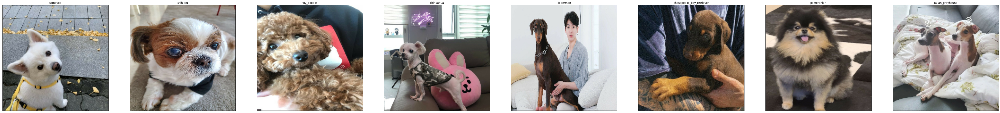

In [ ]:
# Check custom image predictions
plt.figure(figsize=(30,30))
for i, image in enumerate(custom_images):
  plt.subplot(1, 8, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)